<a href="https://colab.research.google.com/github/dveni/padel-with-computer-vision/blob/main/Padel_players_heatmaps_during_game.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/open-mmlab/mmpose/blob/main/demo/MMPose_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The problem

The World Padel Tour technical team requires an automatic system to obtain detections on one of its public videos.
The algorithm should be able to detect in each of the images the following categories of objects: person, ball and racket. The detections will be represented by means of a bounding box per object, which should be consistent throughout the sequence. To solve the
the problem, the following points can be considered:
- The algorithm can be implemented from scratch or be the result of public codes and/or libraries.
and/or public libraries.
- The model should maximize the computational efficiency vs. effectiveness ratio.
That is, while the algorithm is capable of detecting the above categories, it should do so with a model that is as simple as possible,
it should do so with a model as simple as possible.
- Once the detections are obtained, perform heat mapping on a virtual field in zenithal view of the players only. Each player can be coded
in this view by a point on the plane.
- The duration of the video can be truncated to 20 seconds of match. 

## What does this notebook attempts to solve?

The stated problem is complex and little time was given to solve it (24h). If we add my lack of experience with CV tools and concepts, we end up pulling an all-nighter or constraining the scope of the problem. As I value my sleep schedule,  I decided to break down the problem:
- Detecting the racket is difficult without training my own neural net, since current models are trained on the [COCO dataset](https://cocodataset.org/) where there are only *tennis* rackets, not *padel* rackets. Although similar, they have some differences that could decrease the performance of the detection models.
- Detecting the ball is a known problem that a existing models solves pretty well: [TrackNet](https://nol.cs.nctu.edu.tw/ndo3je6av9/). We wanted to also implement it but we did not get there on time.
- Efficiency is important, but shouldn't be your main priority when building a PoC.
- Thus, we'll focus on the player detection problem to create their heatmap on a virtual zenithal view. Our approach is to compute the player projection on the image-court plane, to project it to the zenithal space-court plane using the **homography**.

## Useful resources

We based this work in the following resources:
- [OpenMMLab](https://github.com/open-mmlab): Open source projects for academic research and industrial applications covering a wide range of research topics of computer vision. We used the pose estimation and object detection projects. Specifically, this notebook is partly besed on [their demo notebook](https://github.com/open-mmlab/mmpose/blob/master/demo/MMPose_Tutorial.ipynb) and [demo functions](https://github.com/open-mmlab/mmpose/blob/master/demo/top_down_video_demo_with_mmdet.py).
- [Estimating Player Positions from Padel High-Angle Videos: Accuracy Comparison of Recent Computer Vision Methods](https://www.researchgate.net/publication/351497280_Estimating_Player_Positions_from_Padel_High-Angle_Videos_Accuracy_Comparison_of_Recent_Computer_Vision_Methods): The work where we based the main ideas of this notebook. Check it out.
- [Tennis Tracking 🎾](https://github.com/ArtLabss/tennis-tracking): Similar project but for tennis. It was great to take a look at their implementation.
- [Image Stitching Lecture series by Shree Nayar, Columbia University](https://www.youtube.com/watch?v=J1DwQzab6Jg&list=PL2zRqk16wsdp8KbDfHKvPYNGF2L-zQASc). I watched the first 4 videos, it was great to get a concepttual understanding of what's going on.
- [Pysource videos like this one](https://www.youtube.com/watch?v=_aTC-Rc4Io0): Great hands-on tutorials to learn to use OpenCV.
- [OpenCV](https://opencv.org/). First time using the library, it's truly awesome.
- There may be some links in the comments of the cell when I used someone else code.

## Disclaimer

This notebook is the result of a 24-hour sprint (actually less due to I have to sleep, eat, have a life...). So it's pretty messy and the implementation it's not the most efficient of the world.

# Get a video

I used [this video](https://www.youtube.com/watch?v=QktoWS0pwpE) with the top plays of WPT Barcelona Master 2021.

Then I cut a short part of the video to run the algorithm faster using ffmpeg tool as you can see below.

In [ ]:
!ffmpeg -ss 00:00:01 -i input-video.mp4 -t 00:00:20 output-video.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

# Install libraries

In [2]:
# check NVCC version
!nvcc -V

# check GCC version
!gcc --version

# check python in conda environtment
!which python

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

/usr/local/bin/python


In [1]:
# install pytorch
!pip install torch

# install mmcv-full
!pip install mmcv-full

# install mmdet for inference demo
!pip install mmdet

# clone mmpose repo
!rm -rf mmpose
!git clone https://github.com/open-mmlab/mmpose.git
%cd mmpose

# install mmpose dependencies
!pip install -r requirements.txt

# install mmpose in develop mode
!pip install -e .

Cloning into 'mmpose'...
remote: Enumerating objects: 13876, done.
remote: Counting objects: 100% (5587/5587), done.
remote: Compressing objects: 100% (1304/1304), done.
remote: Total 13876 (delta 4892), reused 4285 (delta 4283), pack-reused 8289
Receiving objects: 100% (13876/13876), 21.44 MiB | 30.16 MiB/s, done.
Resolving deltas: 100% (9628/9628), done.
/content/mmpose
Ignoring dataclasses: markers 'python_version == "3.6"' don't match your environment
  Cloning https://github.com/svenkreiss/poseval.git to /tmp/pip-install-qih3ipop/poseval_e40ea6385a3e4ceebbf63e0c05de315d
  Running command git clone -q https://github.com/svenkreiss/poseval.git /tmp/pip-install-qih3ipop/poseval_e40ea6385a3e4ceebbf63e0c05de315d
  Running command git submodule update --init --recursive -q
Obtaining file:///content/mmpose
  Cloning https://github.com/svenkreiss/poseval.git to /tmp/pip-install-dc57qyah/poseval_411aa2f5919145868678f779cdba6177
  Running command git clone -q https://github.com/svenkreiss/p

In [2]:
# Check Pytorch installation
import torch, torchvision
print('torch version:', torch.__version__, torch.cuda.is_available())
print('torchvision version:', torchvision.__version__)

# Check MMPose installation
import mmpose
print('mmpose version:', mmpose.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print('cuda version:', get_compiling_cuda_version())
print('compiler information:', get_compiler_version())

torch version: 1.9.0+cu102 True
torchvision version: 0.10.0+cu102
mmpose version: 0.18.0
cuda version: 11.1
compiler information: GCC 7.5


In [3]:
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.9.0+cu102 (Tesla K80)


# Chop the video

You don't want to process all the frames every time you want to test something.

In [4]:
import os
from glob import glob

import cv2


def make_folder(folder_path):
    if not os.path.isdir(folder_path):
        os.makedirs(folder_path)


def extract_images_from_videos(video_path, out_images_dir):
    video_fn = os.path.basename(video_path)[:-4]
    sub_images_dir = os.path.join(out_images_dir, video_fn)

    make_folder(sub_images_dir)

    video_cap = cv2.VideoCapture(video_path)
    n_frames = video_cap.get(cv2.CAP_PROP_FRAME_COUNT)
    f_width = video_cap.get(cv2.CAP_PROP_FRAME_WIDTH)
    f_height = video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
    print('video_fn: {}.mp4, number of frames: {}, f_width: {}, f_height: {}'.format(video_fn, n_frames, f_width,
                                                                                     f_height))

    frame_cnt = -1
    while True:
        ret, img = video_cap.read()
        if ret:
            frame_cnt += 1
            image_path = os.path.join(sub_images_dir, 'img_{:06d}.jpg'.format(frame_cnt))
            if os.path.isfile(image_path):
                print('video {} had been already extracted'.format(video_path))
                break
            cv2.imwrite(image_path, img)
        else:
            break
        # if cv2.waitKey(10) & 0xFF == ord('q'):
        #     break
    video_cap.release()
    print('done extraction: {}'.format(video_path))

In [10]:
 video_path = "/content/padel-final.mp4"
 out_images_dir = "/content/images/"
 extract_images_from_videos(video_path, out_images_dir)

video_fn: padel-final.mp4, number of frames: 476.0, f_width: 1920.0, f_height: 1080.0
done extraction: /content/padel-final.mp4


# Court detection

Why do we want to detect the court? Basically, the main goal is to be able to translate the points in the image court plane to the zenithal court plane. To this aim, we'll use the homography to interchange points between the planes. The homography is computed with at least 4 points, so we decided to detect the corners. For this, we detected the court contour by:
1. Blurring the image
2. Using a mask to detect blue contours in the image
3. Get the biggest are contour
4. Approximate the most similar polygon, defined by the 4 vertices (the corners!). 

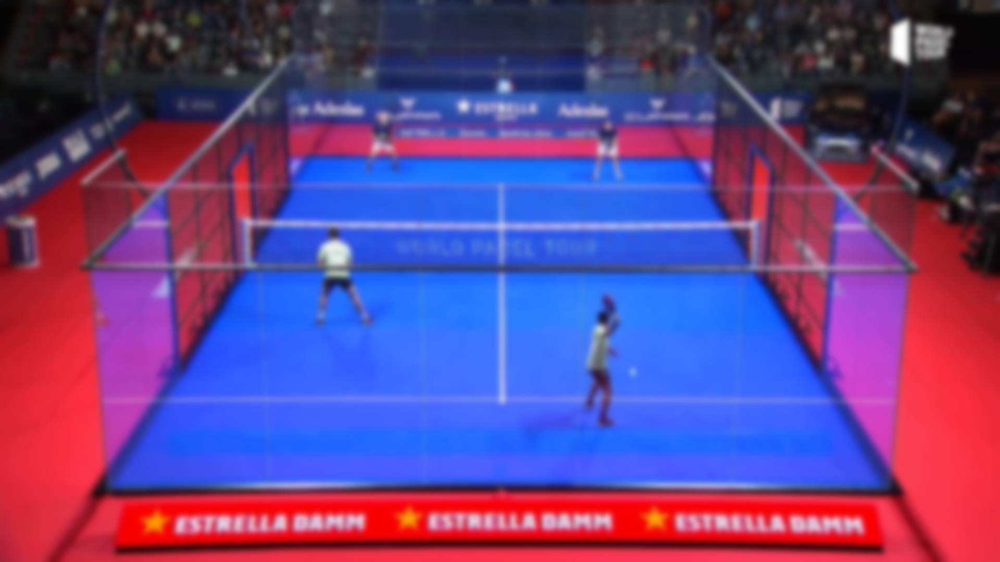

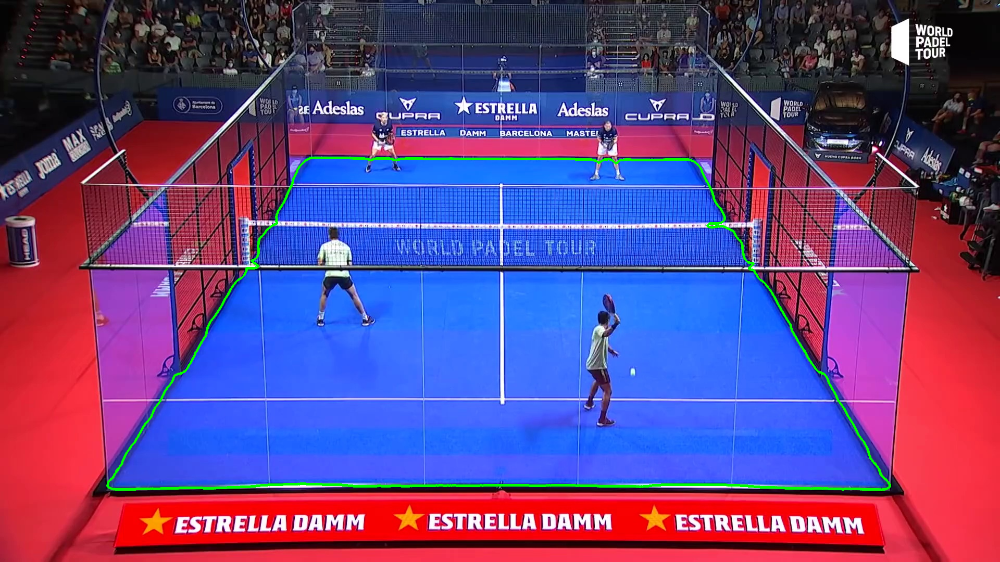

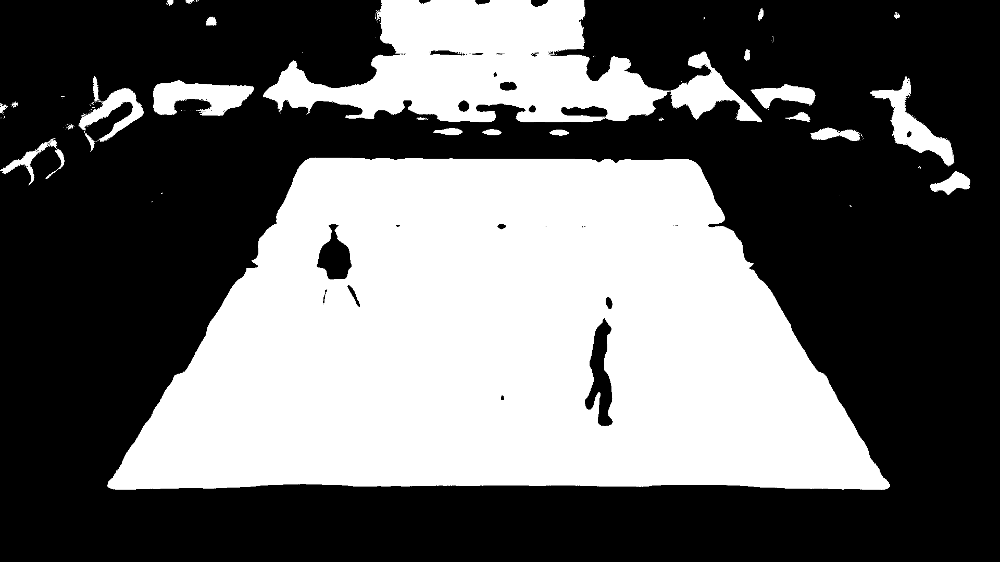

In [11]:
# https://pysource.com/2018/03/01/find-and-draw-contours-opencv-3-4-with-python-3-tutorial-19/
#about blurring: https://www.pyimagesearch.com/2021/04/28/opencv-smoothing-and-blurring/

import cv2
import numpy as np
from google.colab.patches import cv2_imshow


image_path = "/content/images/padel-final/img_000000.jpg"
image = cv2.imread(image_path)

blurred_frame = cv2.GaussianBlur(image, (35, 35), 0)
# blurred_frame = cv2.medianBlur(image, 35)
cv2_imshow(blurred_frame)
hsv = cv2.cvtColor(blurred_frame, cv2.COLOR_BGR2HSV)
lower_blue = np.array([100, 86, 0])
upper_blue = np.array([118, 255, 255])
mask = cv2.inRange(hsv, lower_blue, upper_blue)
# cv2_imshow(mask)

contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
max_contour = 0
max_area = 0
for contour in contours:
    area = cv2.contourArea(contour)
    if area > max_area:
      max_area = area
      max_contour = contour
cv2.drawContours(image, max_contour, -1, (0, 255, 0), 3)
cv2_imshow(image)
cv2_imshow(mask)

Printing corner: [[206 930]]


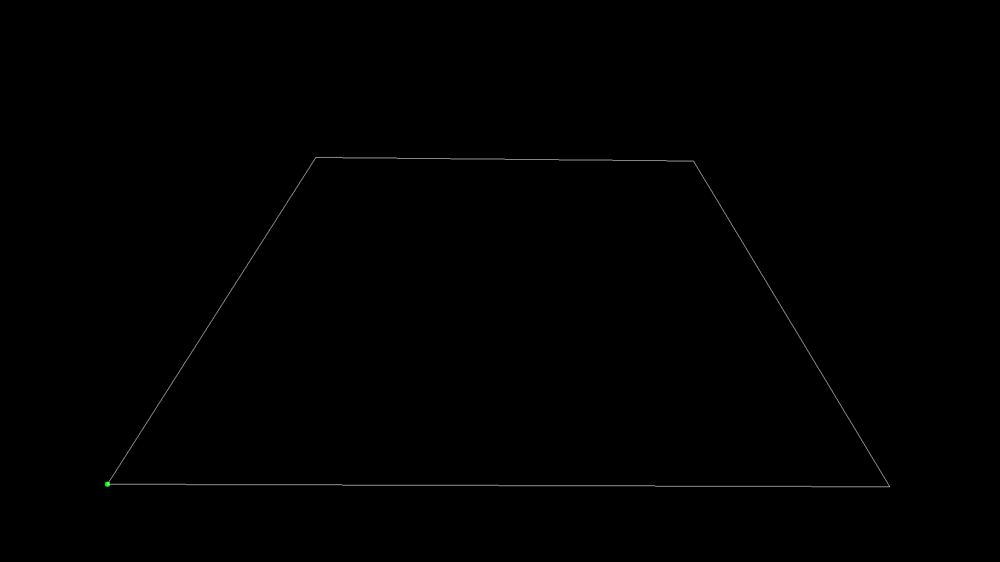

Printing corner: [[1708  935]]


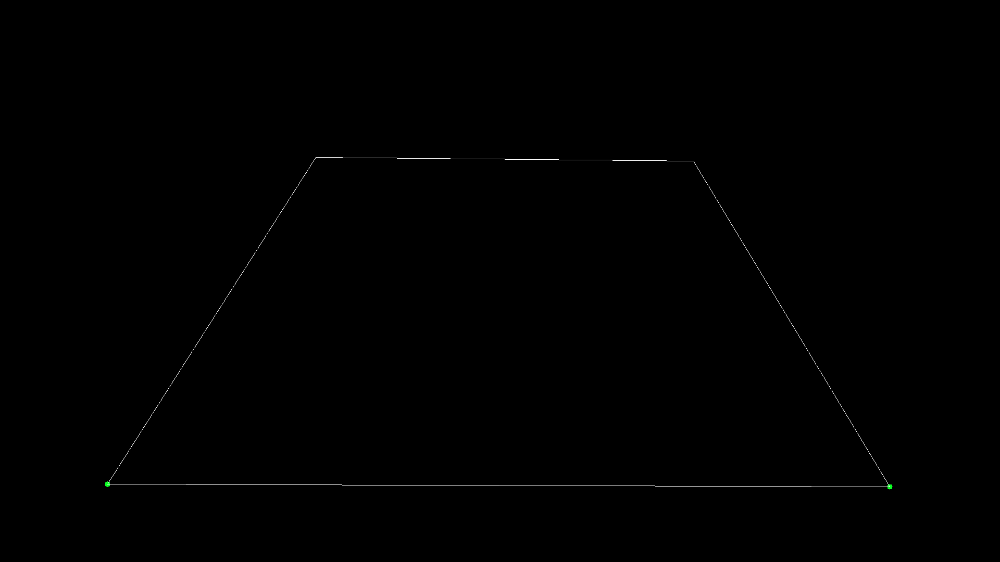

Printing corner: [[1331  309]]


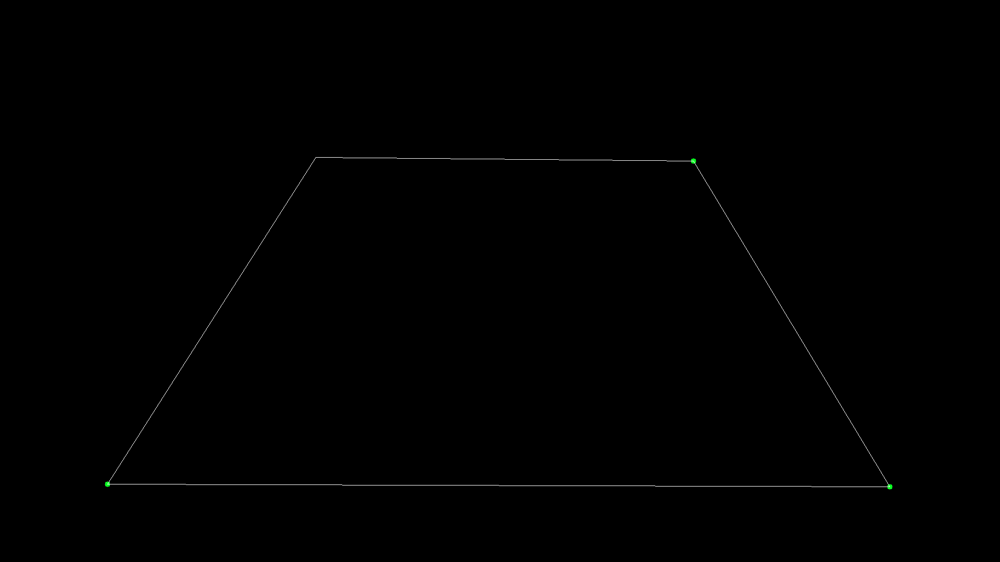

Printing corner: [[606 302]]


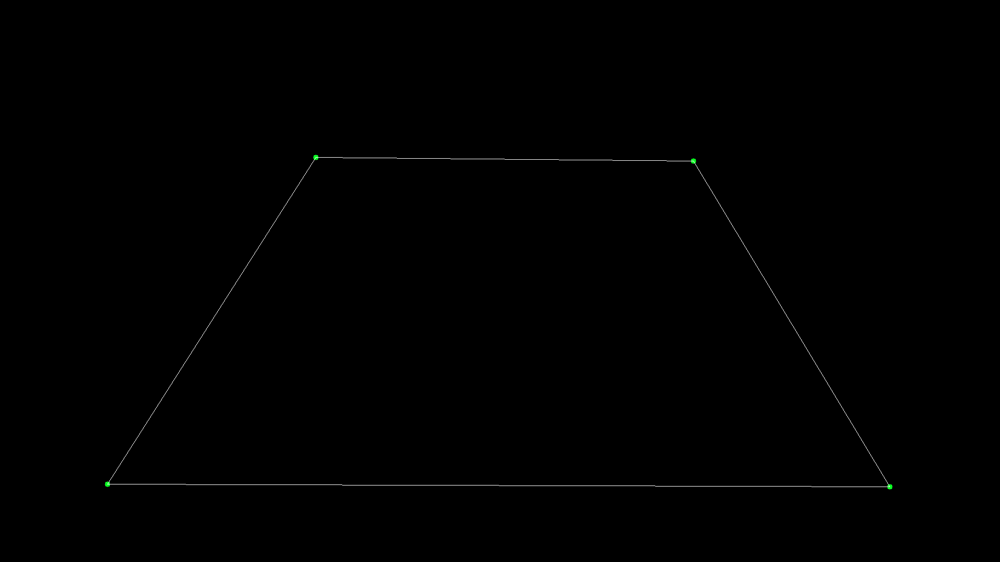

In [12]:
mask = np.zeros(image.shape, np.uint8)
hh, ww = image.shape[:2]
approx = cv2.approxPolyDP(max_contour, 0.1 * ww, closed=True)
for corner in approx:
    print(f"Printing corner: {corner}")
    x,y = corner.ravel()
    cv2.circle(mask,(x,y),5,(36,255,12),-1)
    cv2.drawContours(mask, [approx], -1, (255,255,255),1)
    cv2_imshow(mask)

# Homography

Once we have the corners in the image, we can compute the homography matrix. First, we define our virtual court as a parallelogram and map the corners in both planes. Then, we can use the matrix to translate any other point from the image plane to the zenithal plane.

Points further in the 3D dimension captured by the camera present more distorsion than those in nearer to the camera.

In [13]:
court_dimensions = np.array(([0,20], [10, 20], [10,0], [0,0]), dtype=np.int32)
court_dimensions = court_dimensions + 1
background = np.array((25,15),dtype=np.int32)

In [14]:
court_dimensions *= 40


In [15]:
padding = np.amin(court_dimensions, axis=1)[0]
background = np.array((np.amax(court_dimensions, axis=1)[0] + padding ,np.amax(court_dimensions, axis=0)[0] + padding),dtype=np.int32)

In [16]:
court_dimensions

array([[ 40, 840],
       [440, 840],
       [440,  40],
       [ 40,  40]], dtype=int32)

In [17]:
approx

array([[[ 206,  930]],

       [[1708,  935]],

       [[1331,  309]],

       [[ 606,  302]]], dtype=int32)

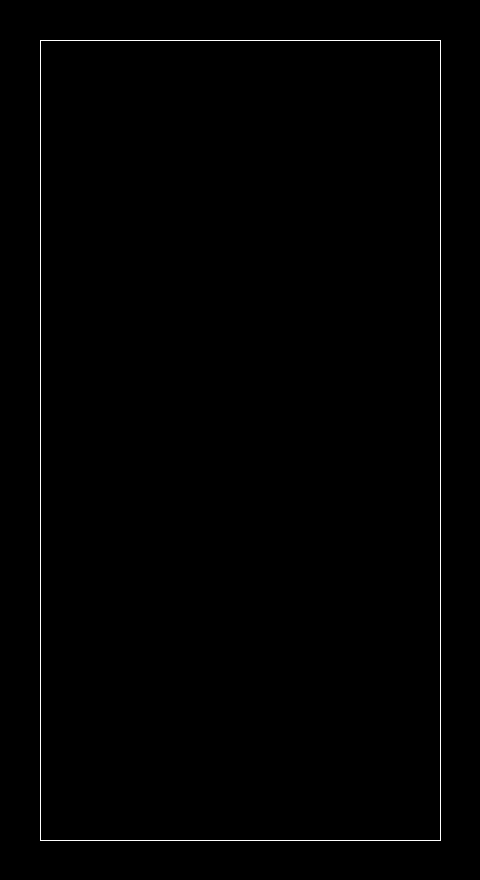

In [18]:
court = np.zeros(background, np.int32)
cv2.drawContours(court, [court_dimensions], -1, (255,255,255),1)
cv2_imshow(court)

In [19]:
h, status = cv2.findHomography(approx, court_dimensions)
h

array([[ 1.08237872e+00,  8.26416642e-01, -8.25809526e+02],
       [-5.27590278e-02,  5.38135972e+00, -1.51350886e+03],
       [-5.27720573e-05,  3.39147337e-03,  1.00000000e+00]])

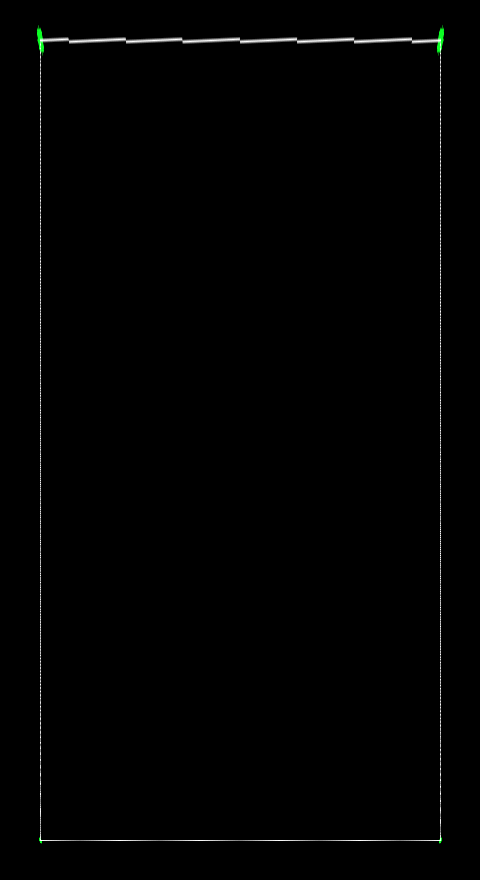

In [20]:
im_dst = cv2.warpPerspective(mask, h, (background[1], background[0]))
cv2_imshow(im_dst)

# MMPose

Let's estimate the pose of the players. Similarly to the ideas presented in the mentioned paper, we will compute the player position in the image court plane using the hip and feet keypoints. Indeed, the player position will be (Hx, (LFy + RFy)/2) where Hx is the x-coordinate of the hip position, and LFy and RFy are the y-coordinates of the left and right feet respectively.

The algorithm with the best performance is a top-down approach where the players are first detected using a Resnet model and then the skeletons are build in the resulting bounding boxes using the HRNet model. MMPose makes it really easy to implement both of them.

## Inference with an MMPose model

MMPose provides high level APIs for model inference and training.

Use load_from_http loader


Downloading: "https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth" to /root/.cache/torch/hub/checkpoints/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth


  0%|          | 0.00/243M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


Use load_from_http loader


Downloading: "https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth" to /root/.cache/torch/hub/checkpoints/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


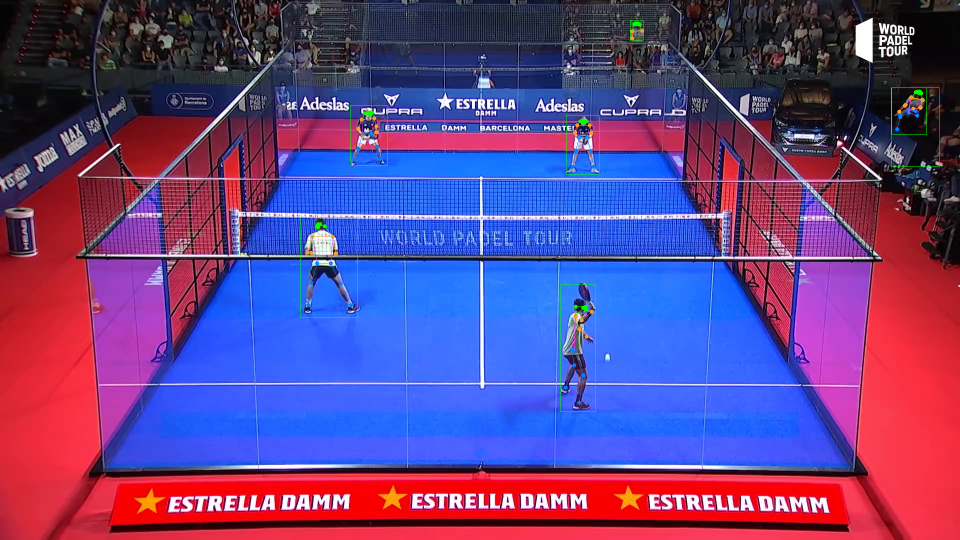

In [21]:
import cv2
from mmpose.apis import (inference_top_down_pose_model, init_pose_model,
                         process_mmdet_results, vis_pose_result)
local_runtime = False

try:
  from google.colab.patches import cv2_imshow  # for image visualization in colab
except:
  local_runtime = True

try:
    from mmdet.apis import inference_detector, init_detector
    has_mmdet = True
except (ImportError, ModuleNotFoundError):
    has_mmdet = False

pose_config = 'configs/body/2d_kpt_sview_rgb_img/topdown_heatmap/coco/hrnet_w48_coco_256x192.py'
pose_checkpoint = 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth'
det_config = 'demo/mmdetection_cfg/faster_rcnn_r50_fpn_coco.py'
det_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'

# initialize pose model
pose_model = init_pose_model(pose_config, pose_checkpoint)
# initialize detector
det_model = init_detector(det_config, det_checkpoint)

img = '/content/images/padel-final/img_000000.jpg'

# inference detection
mmdet_results = inference_detector(det_model, img)

# extract person (COCO_ID=1) bounding boxes from the detection results
person_results = process_mmdet_results(mmdet_results, cat_id=1)

# inference pose
pose_results, returned_outputs = inference_top_down_pose_model(pose_model,
                                                               img,
                                                               person_results,
                                                               bbox_thr=0.3,
                                                               format='xyxy',
                                                               dataset=pose_model.cfg.data.test.type)

# show pose estimation results
vis_result = vis_pose_result(pose_model,
                             img,
                             pose_results,
                             dataset=pose_model.cfg.data.test.type,
                             show=False)
# reduce image size
vis_result = cv2.resize(vis_result, dsize=None, fx=0.5, fy=0.5)

if local_runtime:
  from IPython.display import Image, display
  import tempfile
  import os.path as osp
  with tempfile.TemporaryDirectory() as tmpdir:
    file_name = osp.join(tmpdir, 'pose_results.png')
    cv2.imwrite(file_name, vis_result)
    display(Image(file_name))
else:
  cv2_imshow(vis_result)



## Detecting *only* the players

As you can see, some people in the public are also detected, which we want to avoid. So we create a mask of the court, big enough to not leave out the palyers, and detect the platers inside the mask.

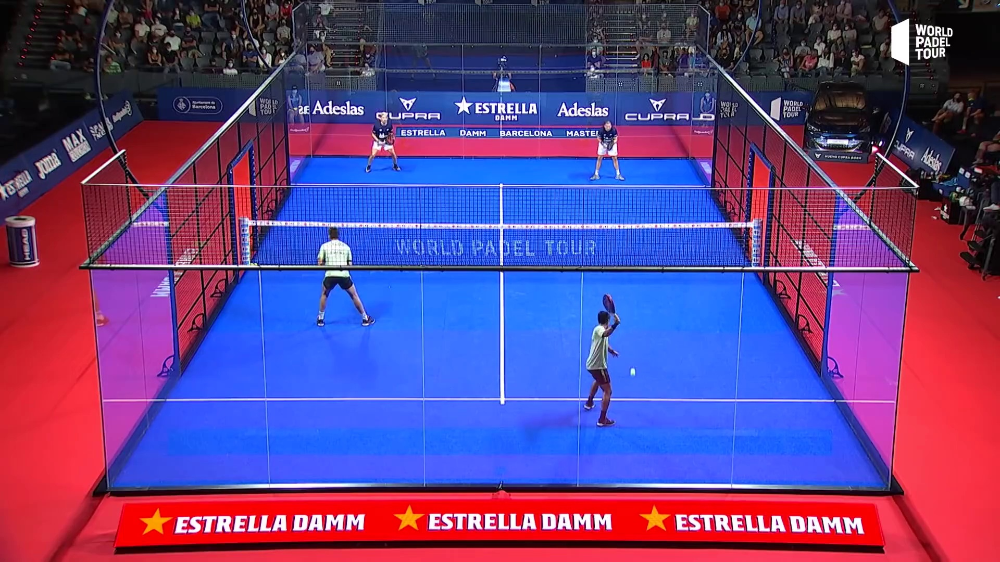

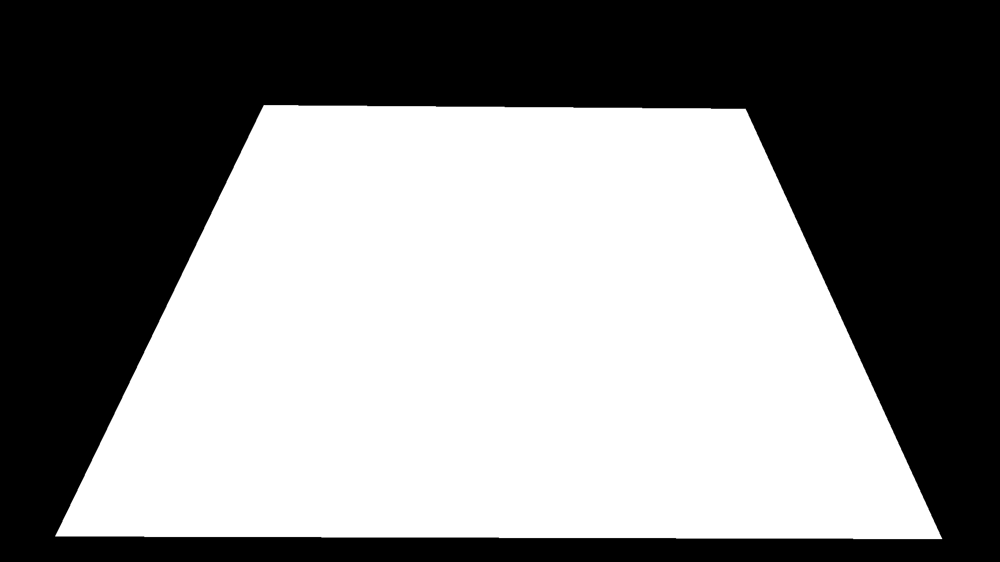

In [22]:
img_path = '/content/images/padel-final/img_000000.jpg'
img = cv2.imread(img_path)
cv2_imshow(img)
mask = np.zeros(img.shape[:2], np.uint8)
mask_contour = np.array(approx)
padding = 100
mask_contour[:,:,0][mask_contour[:,:,0]>1000] += padding
mask_contour[:,:,0][mask_contour[:,:,0]<1000] -= padding
mask_contour[:,:,1][mask_contour[:,:,1]>500] += padding
mask_contour[:,:,1][mask_contour[:,:,1]<500] -= padding

cv2.drawContours(mask, [mask_contour], -1, (255,255,255), -1)
cv2_imshow(mask)


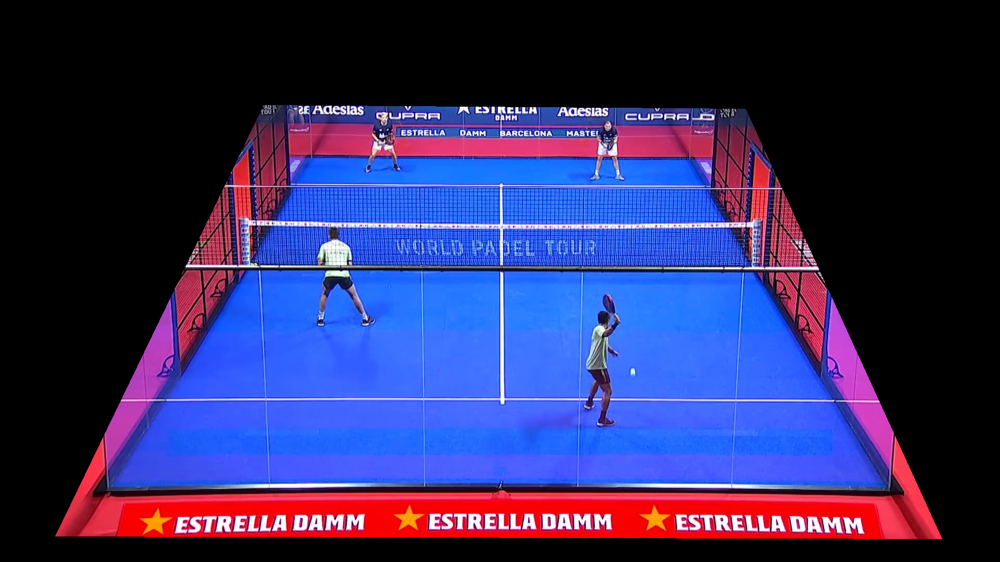

In [23]:
image_court = img.copy()
image_court[mask == 0, :] = (0, 0, 0)
cv2_imshow(image_court)

Use load_from_http loader


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


Use load_from_http loader


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


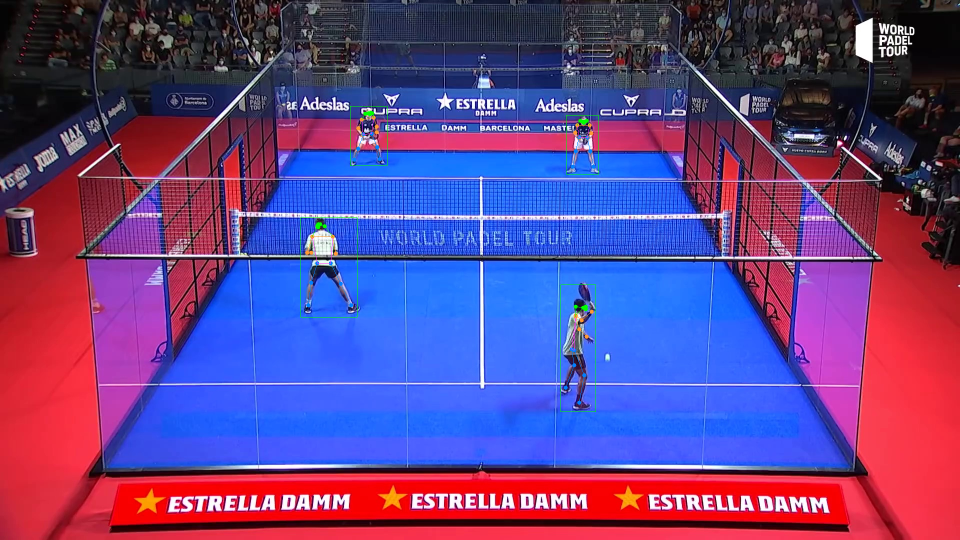

In [24]:
pose_config = 'configs/body/2d_kpt_sview_rgb_img/topdown_heatmap/coco/hrnet_w48_coco_256x192.py'
pose_checkpoint = 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth'
det_config = 'demo/mmdetection_cfg/faster_rcnn_r50_fpn_coco.py'
det_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'

# initialize pose model
pose_model = init_pose_model(pose_config, pose_checkpoint)
# initialize detector
det_model = init_detector(det_config, det_checkpoint)

img_path = '/content/images/padel-final/img_000000.jpg'
img = cv2.imread(img_path)
mask = np.zeros(img.shape[:2], np.uint8)
mask_contour = np.array(approx)
padding = 100
mask_contour[:,:,0][mask_contour[:,:,0]>1000] += padding
mask_contour[:,:,0][mask_contour[:,:,0]<1000] -= padding
mask_contour[:,:,1][mask_contour[:,:,1]>500] += padding
mask_contour[:,:,1][mask_contour[:,:,1]<500] -= padding

cv2.drawContours(mask, [mask_contour], -1, (255,255,255), -1)

image_court = img.copy()
image_court[mask == 0, :] = (0, 0, 0)

# inference detection
mmdet_results = inference_detector(det_model, image_court)

# extract person (COCO_ID=1) bounding boxes from the detection results
person_results = process_mmdet_results(mmdet_results, cat_id=1)

# inference pose
pose_results, returned_outputs = inference_top_down_pose_model(pose_model,
                                                               img,
                                                               person_results,
                                                               bbox_thr=0.3,
                                                               format='xyxy',
                                                               dataset=pose_model.cfg.data.test.type)

# show pose estimation results
vis_result = vis_pose_result(pose_model,
                             img,
                             pose_results,
                             dataset=pose_model.cfg.data.test.type,
                             show=False)
# reduce image size
vis_result = cv2.resize(vis_result, dsize=None, fx=0.5, fy=0.5)

if local_runtime:
  from IPython.display import Image, display
  import tempfile
  import os.path as osp
  with tempfile.TemporaryDirectory() as tmpdir:
    file_name = osp.join(tmpdir, 'pose_results.png')
    cv2.imwrite(file_name, vis_result)
    display(Image(file_name))
else:
  cv2_imshow(vis_result)

Printing keypoint: [741.9381    225.22717     0.9407323]


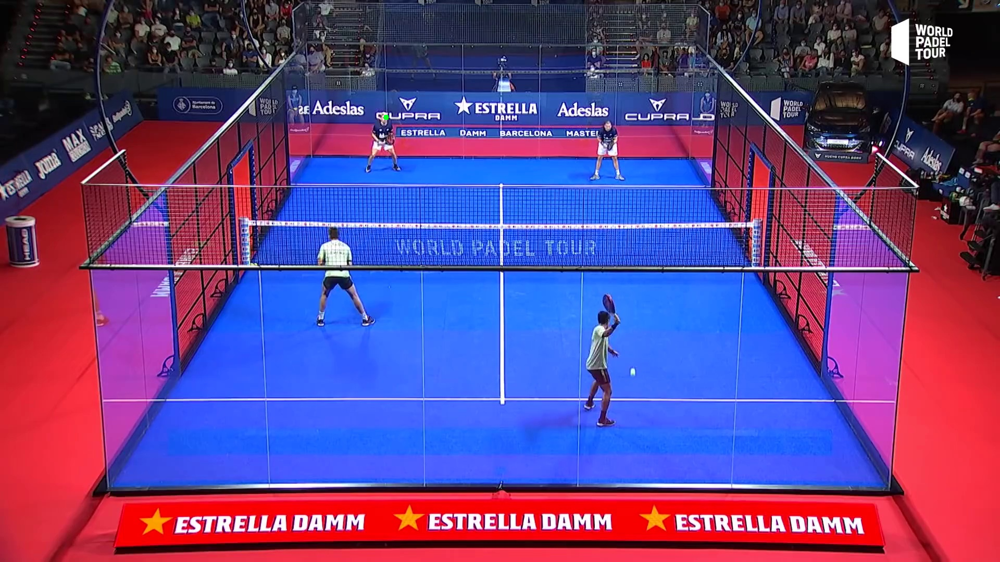

In [26]:
"""
COCO Output Format Nose – 0, Neck – 1, Right Shoulder – 2, Right Elbow – 3, Right Wrist – 4, Left Shoulder – 5, Left Elbow – 6,
 Left Wrist – 7, Right Hip – 8, Right Knee – 9, Right Ankle – 10, Left Hip – 11, Left Knee – 12, LAnkle – 13, Right Eye – 14,
  Left Eye – 15, Right Ear – 16, Left Ear – 17, Background – 18

  This is the COCO keypoints definitions according to some site I lost, but in this library the keypoints are nothing like this. 
  In fact, our keypoints of interest are:
  left_hip = 11
  right_hip = 12
  left_foot = 15
  right_foot = 16
"""
img_path = '/content/images/padel-final/img_000000.jpg'
img = cv2.imread(img_path)
keypoint = pose_results[3]['keypoints'][1]
print(f"Printing keypoint: {keypoint}")
x,y,_ = keypoint
cv2.circle(img,(int(x),int(y)),5,(36,255,12),-1)
#cv2.drawContours(mask, [approx], -1, (255,255,255),1)
cv2_imshow(img)

In [27]:
players = []
for result in pose_results:
  left_hip = result['keypoints'][11]
  right_hip = result['keypoints'][12]
  # We compute the mean of left and right hips to get the "central" hip point.
  hip = ((left_hip[0] + right_hip[0])/2, (left_hip[1] + right_hip[1])/2)
  left_foot = (result['keypoints'][15][0], result['keypoints'][15][1])
  right_foot = (result['keypoints'][16][0], result['keypoints'][16][1])
  players.append((hip, left_foot, right_foot))

In [28]:
player_0 = []
player_1 = []
player_2 = []
player_3 = []

# Compute the player position projected on the court plane.
def getPosition(keypoints):
  hip, left_foot, right_foot = keypoints
  return (hip[0], (left_foot[1]+right_foot[1])/2)

player_0.append(getPosition(players[0]))
player_1.append(getPosition(players[1]))
player_2.append(getPosition(players[2]))
player_3.append(getPosition(players[3]))

playerPositions = [player_0, player_1, player_2, player_3]

Printing pos: [(647.8907470703125, 610.6078491210938)]
Printing pos: [(1166.4373779296875, 333.4804382324219)]
Printing pos: [(1146.09619140625, 790.65673828125)]
Printing pos: [(734.931396484375, 319.2328796386719)]


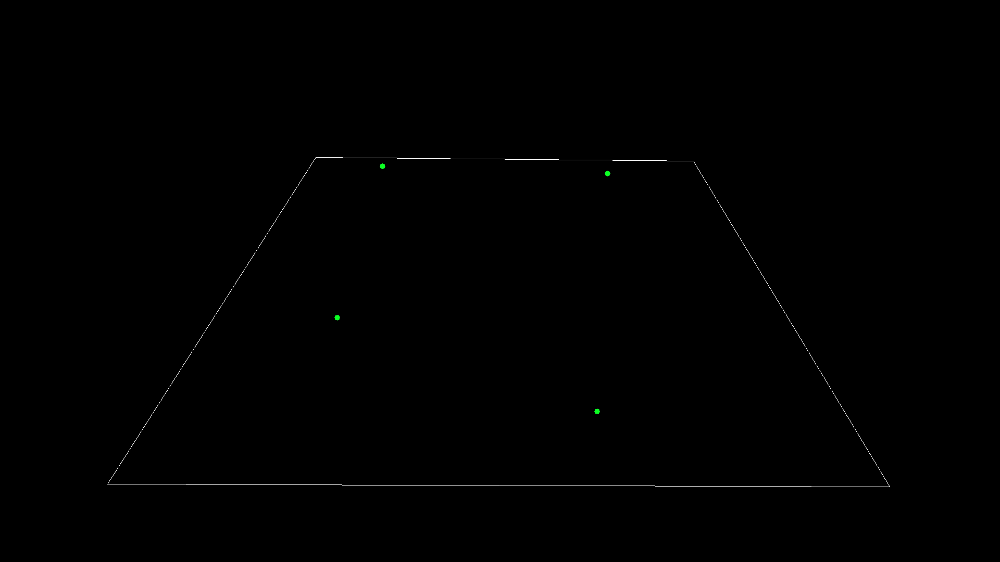

In [29]:
# Represent the player positions in the court plane.

img_path = '/content/images/padel-final/img_000000.jpg'
img = cv2.imread(img_path)
mask = np.zeros(img.shape, np.uint8)
hh, ww = img.shape[:2]
approx = cv2.approxPolyDP(max_contour, 0.1 * ww, closed=True)
for pos in playerPositions:
    print(f"Printing pos: {pos}")
    x,y = pos[0][0], pos[0][1]
    cv2.circle(mask,(int(x),int(y)),5,(36,255,12),-1)
    cv2.drawContours(mask, [approx], -1, (255,255,255),1)
cv2_imshow(mask)

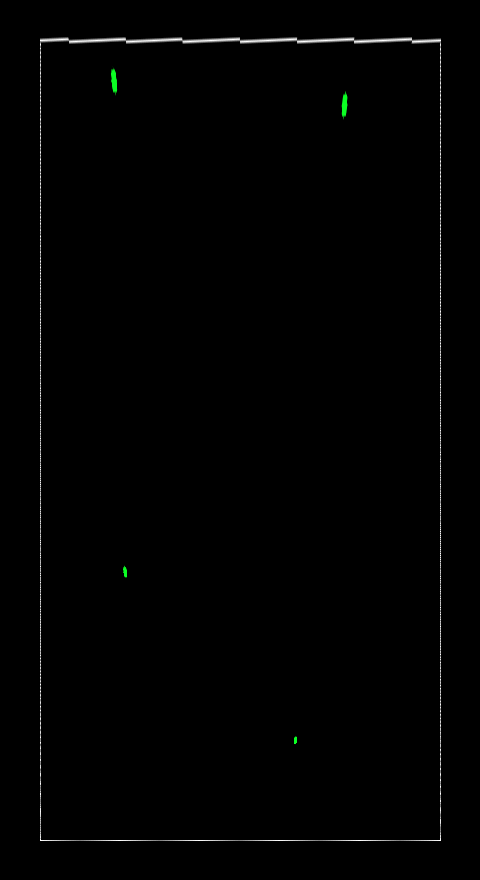

In [30]:
# Translate the player positions to the zenithal court plane
im_dst = cv2.warpPerspective(mask, h, (background[1], background[0]))
cv2_imshow(im_dst)

## Process video

Exactly the same we did for the image, but for the a whole video

Use load_from_http loader


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


Use load_from_http loader


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


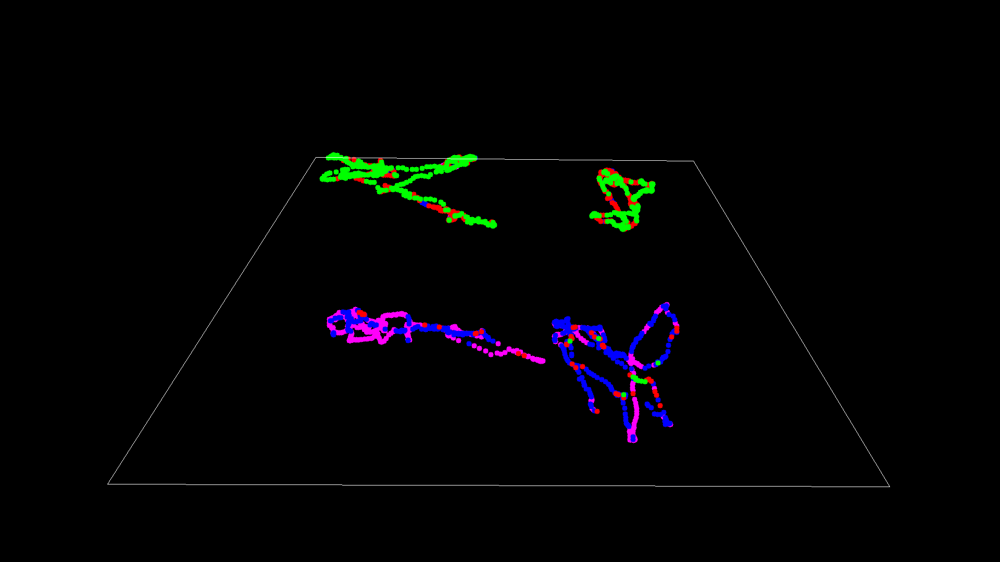

In [31]:
import os

pose_config = 'configs/body/2d_kpt_sview_rgb_img/topdown_heatmap/coco/hrnet_w48_coco_256x192.py'
pose_checkpoint = 'https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth'
det_config = 'demo/mmdetection_cfg/faster_rcnn_r50_fpn_coco.py'
det_checkpoint = 'https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth'

# initialize pose model
pose_model = init_pose_model(pose_config, pose_checkpoint)
# initialize detector
det_model = init_detector(det_config, det_checkpoint)


cap = cv2.VideoCapture("/content/padel-final.mp4")
assert cap.isOpened(), f'Faild to load video file {"/content/padel-final.mp4"}'


os.makedirs("/content/video/", exist_ok=True)
save_out_video = True

if save_out_video:
    fps = cap.get(cv2.CAP_PROP_FPS)
    size = (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)),
            int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    videoWriter = cv2.VideoWriter(
        os.path.join("/content/video/",
                      f'vis_{os.path.basename("/content/padel-final.mp4")}'), fourcc,
        fps, size)
# e.g. use ('backbone', ) to return backbone feature
output_layer_names = None



player_0 = []
player_1 = []
player_2 = []
player_3 = []

while (cap.isOpened()):
    flag, img = cap.read()
    if not flag:
        break
    # test a single image, the resulting box is (x1, y1, x2, y2)

    mask = np.zeros(img.shape[:2], np.uint8)
    mask_contour = np.array(approx)
    padding = 100
    mask_contour[:,:,0][mask_contour[:,:,0]>1000] += padding
    mask_contour[:,:,0][mask_contour[:,:,0]<1000] -= padding
    mask_contour[:,:,1][mask_contour[:,:,1]>500] += padding
    mask_contour[:,:,1][mask_contour[:,:,1]<500] -= padding

    cv2.drawContours(mask, [mask_contour], -1, (255,255,255), -1)

    image_court = img.copy()
    image_court[mask == 0, :] = (0, 0, 0)

    # inference detection
    mmdet_results = inference_detector(det_model, image_court)

    # extract person (COCO_ID=1) bounding boxes from the detection results
    person_results = process_mmdet_results(mmdet_results, cat_id=1)

    # inference pose
    pose_results, returned_outputs = inference_top_down_pose_model(pose_model,
                                                                  img,
                                                                  person_results,
                                                                  bbox_thr=0.3,
                                                                  format='xyxy',
                                                                  dataset=pose_model.cfg.data.test.type)

    # show pose estimation results
    vis_img = vis_pose_result(pose_model,
                                img,
                                pose_results,
                                dataset=pose_model.cfg.data.test.type,
                                show=False)
    
    if len(pose_results) == 4:
        players = []
        for result in pose_results:
          left_hip = result['keypoints'][11]
          right_hip = result['keypoints'][12]
          hip = ((left_hip[0] + right_hip[0])/2, (left_hip[1] + right_hip[1])/2)
          left_foot = (result['keypoints'][15][0], result['keypoints'][15][1])
          right_foot = (result['keypoints'][16][0], result['keypoints'][16][1])
          players.append((hip, left_foot, right_foot))



        player_0.append(getPosition(players[0]))
        player_1.append(getPosition(players[1]))
        player_2.append(getPosition(players[2]))
        player_3.append(getPosition(players[3]))

        

    if save_out_video:
        videoWriter.write(vis_img)

cap.release()
if save_out_video:
    videoWriter.release()


playerPositions = [player_0, player_1, player_2, player_3]

img_path = '/content/images/padel-final/img_000000.jpg'
img = cv2.imread(img_path)
mask = np.zeros(img.shape, np.uint8)
hh, ww = img.shape[:2]
approx = cv2.approxPolyDP(max_contour, 0.1 * ww, closed=True)
colors = [(250,0, 255),(255,0,0), (0,0,255), (0,255,0)]
for idx,player in enumerate(playerPositions):
    for pos in player:
        x,y = pos[0], pos[1]
        cv2.circle(mask,(int(x),int(y)),5,colors[idx],-1)
    cv2.drawContours(mask, [approx], -1, (255,255,255),1)
cv2_imshow(mask)

As we can see, we tried to colour each of the players trajectories but we didn't take into account that the pose estimation model does not track each of the players. So we have different players in the positions saved for each of the players. However, we can see pretty easily the trajectories for each of the players. This should be easy to solve.

Additionally, we can map the positions to the zenithal court plane using the homography we computed before. It's evident that the method is much more accurate for the players near the camera, but it's a good first approximation to the problem.

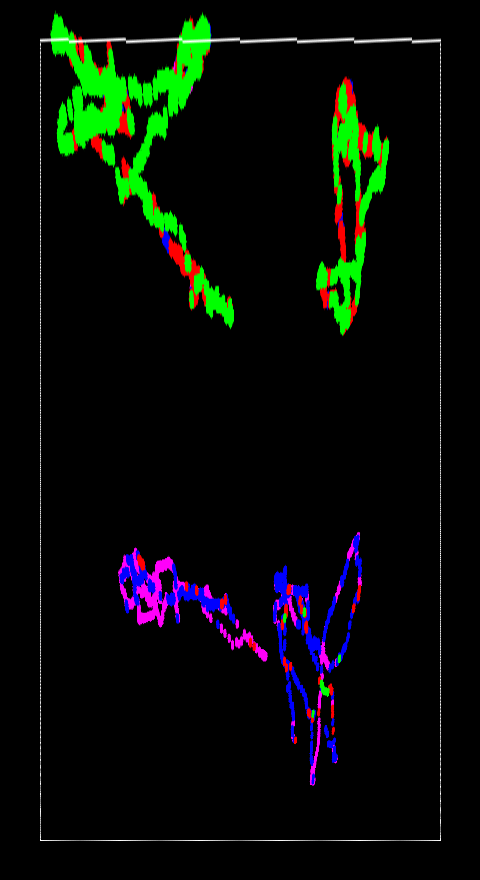

In [33]:
im_dst = cv2.warpPerspective(mask, h, (background[1], background[0]))
cv2_imshow(im_dst)